<a href="https://colab.research.google.com/github/Mekondjo-EDSA/in2deep/blob/development/MA_starfish_keras.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Lets check the available gpu in colab
!nvidia-smi

In [ ]:
# For this notebook we are going to use keras - retinanet 
# Lets install Keras retina-net for the same
!git clone https://github.com/fizyr/keras-retinanet.git

!pip install --upgrade keras

%cd keras-retinanet/
!pip install .

!python setup.py build_ext --inplace

!pip install gdown
!pip install tensorflow-gpu

In [ ]:
# Mount google drive so that we can read data from the drive
from google.colab import drive
drive.mount('/content/drive')
'''
# Unmount Drive 
from google.colab import drive
drive.flush_and_unmount()
'''

Mounted at /content/drive


'\n# Unmount Drive \nfrom google.colab import drive\ndrive.flush_and_unmount()\n'

In [ ]:
# Lets load the required packes required for this problem
import numpy as np
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from pandas.plotting import register_matplotlib_converters
from sklearn.model_selection import train_test_split
import urllib
import os
import csv
import cv2
import time
from PIL import Image
import ast

from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color


# Lets set some parameters required
%matplotlib inline
%config InlineBackend.figure_format='retina'

register_matplotlib_converters()
sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 22, 10

RANDOM_SEED = 42

np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

In [ ]:
TRAIN_PATH = "../content/drive/MyDrive/tensorflow-great-barrier-reef/train_images/"
HEIGHT, WIDTH = 720, 1280
image_size = 640

vid0_path = "../content/drive/MyDrive/tensorflow-great-barrier-reef/train_images/video_0"
vid1_path = "../content/drive/MyDrive/tensorflow-great-barrier-reef/train_images/video_1"
vid2_path = "../content/drive/MyDrive/tensorflow-great-barrier-reef/train_images/video_2"
vid_paths = [vid0_path, vid1_path, vid2_path]

vid0_ls = [os.path.join(vid0_path,f) for f in os.listdir(vid0_path)]
vid0_ls = sorted(vid0_ls, key=lambda x: int("".join([i for i in x if i.isdigit()])))

vid1_ls = [os.path.join(vid1_path,f) for f in os.listdir(vid1_path)]
vid1_ls = sorted(vid1_ls, key=lambda x: int("".join([i for i in x if i.isdigit()])))

vid2_ls = [os.path.join(vid2_path,f) for f in os.listdir(vid2_path)]
vid2_ls = sorted(vid2_ls, key=lambda x: int("".join([i for i in x if i.isdigit()])))
files_ls = [vid0_ls, vid1_ls, vid2_ls]

train_df = pd.read_csv("../content/drive/MyDrive/tensorflow-great-barrier-reef/train.csv",
                       sep = r',', skipinitialspace = True)

In [ ]:
print(vid0_ls[:3])
print("\n",files_ls[0][:3])

['../content/drive/MyDrive/tensorflow-great-barrier-reef/train_images/video_0/0.jpg', '../content/drive/MyDrive/tensorflow-great-barrier-reef/train_images/video_0/1.jpg', '../content/drive/MyDrive/tensorflow-great-barrier-reef/train_images/video_0/2.jpg']

 ['../content/drive/MyDrive/tensorflow-great-barrier-reef/train_images/video_0/0.jpg', '../content/drive/MyDrive/tensorflow-great-barrier-reef/train_images/video_0/1.jpg', '../content/drive/MyDrive/tensorflow-great-barrier-reef/train_images/video_0/2.jpg']


In [ ]:
len(files_ls[0])

6708

In [ ]:
train_df.head()

,video_id,sequence,video_frame,sequence_frame,image_id,annotations
0,0,40258,0,0,0-0,[]
1,0,40258,1,1,0-1,[]
2,0,40258,2,2,0-2,[]
3,0,40258,3,3,0-3,[]
4,0,40258,4,4,0-4,[]


#### Helper functions

In [ ]:
def get_oldpath(x):
    if x.video_id == 0:
        path = os.path.join(vid0_path,str(x.video_frame)+".jpg")
    elif x.video_id == 1:
        path = os.path.join(vid1_path,str(x.video_frame)+".jpg")
    else:
        path = os.path.join(vid2_path,str(x.video_frame)+".jpg")
        
    return path

def get_newpath(x):
    filename = f"{x.video_id}_{x.video_frame}.jpg"
    return os.path.join("./dataset", filename)

def get_filename(x):
    return f"{x.video_id}_{x.video_frame}.jpg"

In [ ]:
import ast
from tqdm import tqdm
import shutil
train_df = train_df[train_df.annotations != "[]"]
train_df["annotations"] = train_df["annotations"].map(lambda x : ast.literal_eval(x))

train_df["filepath"] = train_df.apply(lambda x : get_oldpath(x), axis=1)
train_df["newpath"] = train_df.apply(lambda x : get_newpath(x), axis=1)
train_df["filename"] = train_df.apply(lambda x : get_filename(x), axis=1)

os.makedirs("./dataset",exist_ok=True)

for i in tqdm(range(len(train_df))):
    src = train_df.iloc[i]["filepath"]
    dst = train_df.iloc[i]["newpath"]
    shutil.copy(src,dst)
    
train_df.head(3)

100%|██████████| 4919/4919 [02:20<00:00, 34.94it/s] 


,video_id,sequence,video_frame,sequence_frame,image_id,annotations,filepath,newpath,filename
16,0,40258,16,16,0-16,"[{'x': 559, 'y': 213, 'width': 50, 'height': 32}]",../content/drive/MyDrive/tensorflow-great-barr...,./dataset/0_16.jpg,0_16.jpg
17,0,40258,17,17,0-17,"[{'x': 558, 'y': 213, 'width': 50, 'height': 32}]",../content/drive/MyDrive/tensorflow-great-barr...,./dataset/0_17.jpg,0_17.jpg
18,0,40258,18,18,0-18,"[{'x': 557, 'y': 213, 'width': 50, 'height': 32}]",../content/drive/MyDrive/tensorflow-great-barr...,./dataset/0_18.jpg,0_18.jpg


In [ ]:
df = train_df
df = df.explode("annotations")

df["width"] = [WIDTH]*len(df)
df["height"] = [HEIGHT]*len(df)
df["label"] = ["starfish"]*len(df)

df["xmin"] = df.apply(lambda x : x.annotations["x"], axis=1)
df["ymin"] = df.apply(lambda x : x.annotations["y"], axis=1)
df["xmax"] = df.apply(lambda x : x.annotations["x"]+x.annotations["width"], axis=1)
df["ymax"] = df.apply(lambda x : x.annotations["y"]+x.annotations["height"], axis=1)

df.loc[df["xmax"] > 1280, "xmax"] = 1280
df.loc[df["ymax"] > 720, "ymax"] = 720

df = df.drop(["video_id","sequence","video_frame","sequence_frame","image_id","annotations","filepath","newpath"], axis=1)
df = df.reset_index(drop=True)
df.head(5)

,filename,width,height,label,xmin,ymin,xmax,ymax
0,0_16.jpg,1280,720,starfish,559,213,609,245
1,0_17.jpg,1280,720,starfish,558,213,608,245
2,0_18.jpg,1280,720,starfish,557,213,607,245
3,0_19.jpg,1280,720,starfish,556,214,606,246
4,0_20.jpg,1280,720,starfish,555,214,605,246


In [ ]:
import random
import matplotlib.pyplot as plt
import matplotlib.image as npimg
import cv2

In [ ]:
def draw_annotations(spot_fish_img, img_row):
    spot_fish_img = cv2.rectangle(spot_fish_img, (img_row['xmin'], img_row['ymin']),
              (img_row['xmax'], img_row['ymax']), (255,255,0), 2)
    return spot_fish_img

In [ ]:

img_row = df.iloc[random.randint(0, len(df))]
img_row

filename    1_8890.jpg
width             1280
height             720
label         starfish
xmin               417
ymin               439
xmax               447
ymax               466
Name: 7071, dtype: object

Text(0.5, 1.0, 'Original Image')

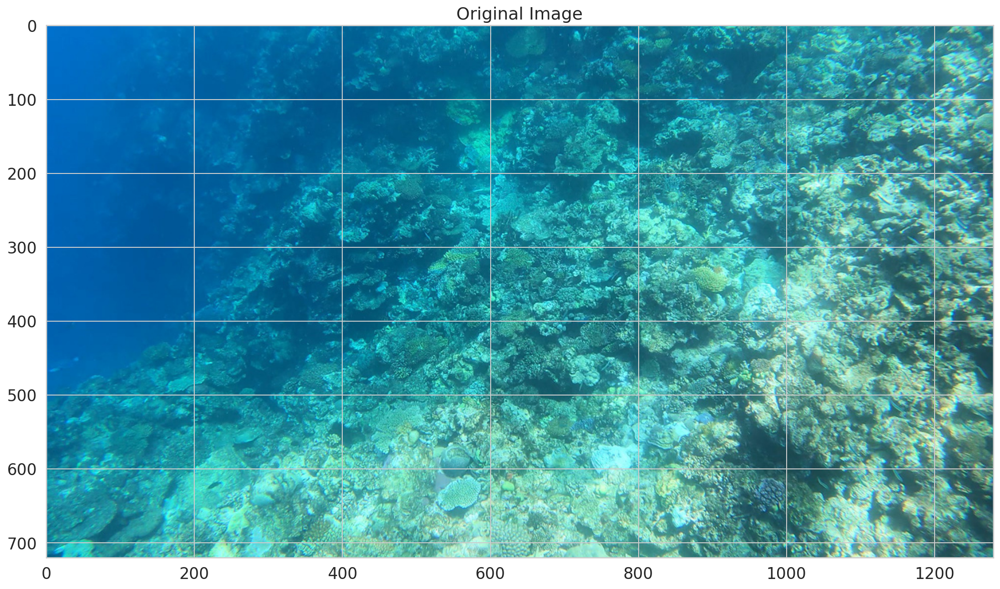

In [ ]:
original_img_path = os.path.join("./dataset", img_row['filename'])
original_img = npimg.imread(original_img_path)

fig, axs = plt.subplots(1, 1, figsize=(15, 10))
fig.tight_layout()

axs.imshow(original_img)
axs.set_title('Original Image')

Text(0.5, 1.0, 'spotfish Image')

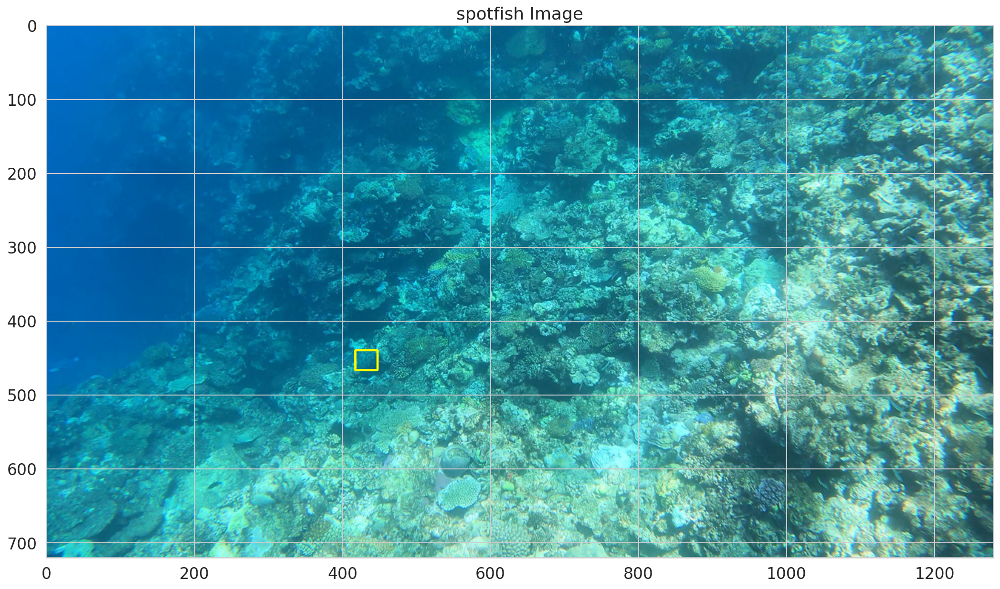

In [ ]:
spot_fish_img = original_img.copy()
draw_annotations(spot_fish_img, img_row)

fig, axs = plt.subplots(1, 1, figsize=(15, 10))
fig.tight_layout()

axs.imshow(spot_fish_img)
axs.set_title('spotfish Image')

In [ ]:
root_dir = '/content'
train_dir = os.path.join(root_dir,'dataset')

In [ ]:
train_dir

'/content/dataset'

In [ ]:
df['image_name'] = train_dir+'/'+df['filename']

In [ ]:
df.head()

,filename,width,height,label,xmin,ymin,xmax,ymax,image_name
0,0_16.jpg,1280,720,starfish,559,213,609,245,/content/dataset/0_16.jpg
1,0_17.jpg,1280,720,starfish,558,213,608,245,/content/dataset/0_17.jpg
2,0_18.jpg,1280,720,starfish,557,213,607,245,/content/dataset/0_18.jpg
3,0_19.jpg,1280,720,starfish,556,214,606,246,/content/dataset/0_19.jpg
4,0_20.jpg,1280,720,starfish,555,214,605,246,/content/dataset/0_20.jpg


In [ ]:
df['xmin'] = df['xmin'].astype(int)
df['ymin'] = df['ymin'].astype(int)
df['xmax'] = df['xmax'].astype(int)
df['ymax'] = df['ymax'].astype(int)

In [ ]:
df.drop(columns=['filename', 'width','height'], axis=1, inplace=True)

In [ ]:
column_names = ["image_name", "xmin", "ymin", "xmax", "ymax", "label"]
df = df.reindex(columns=column_names)

In [ ]:
df.head()

,image_name,xmin,ymin,xmax,ymax,label
0,/content/dataset/0_16.jpg,559,213,609,245,starfish
1,/content/dataset/0_17.jpg,558,213,608,245,starfish
2,/content/dataset/0_18.jpg,557,213,607,245,starfish
3,/content/dataset/0_19.jpg,556,214,606,246,starfish
4,/content/dataset/0_20.jpg,555,214,605,246,starfish


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11898 entries, 0 to 11897
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_name  11898 non-null  object
 1   xmin        11898 non-null  int64 
 2   ymin        11898 non-null  int64 
 3   xmax        11898 non-null  int64 
 4   ymax        11898 non-null  int64 
 5   label       11898 non-null  object
dtypes: int64(4), object(2)
memory usage: 557.8+ KB


In [ ]:
ANNOTATIONS_FILE = 'annotations.csv'
CLASSES_FILE = 'classes.csv'

In [ ]:
df.to_csv(ANNOTATIONS_FILE, index=False, header=None)

In [ ]:
classes = set(['starfish'])

with open(CLASSES_FILE, 'w') as f:
  for i, line in enumerate(sorted(classes)):
    f.write('{},{}\n'.format(line,i))

In [ ]:
!head classes.csv

starfish,0


In [ ]:
!head annotations.csv

/content/dataset/0_16.jpg,559,213,609,245,starfish
/content/dataset/0_17.jpg,558,213,608,245,starfish
/content/dataset/0_18.jpg,557,213,607,245,starfish
/content/dataset/0_19.jpg,556,214,606,246,starfish
/content/dataset/0_20.jpg,555,214,605,246,starfish
/content/dataset/0_21.jpg,550,214,600,246,starfish
/content/dataset/0_22.jpg,538,209,594,256,starfish
/content/dataset/0_23.jpg,535,207,593,255,starfish
/content/dataset/0_24.jpg,532,205,591,254,starfish
/content/dataset/0_25.jpg,529,200,590,250,starfish


In [ ]:
import keras
import keras_resnet
import urllib.request
PRETRAINED_MODEL = './snapshots/_pretrained_model.h5'
#### OPTION 1: DOWNLOAD INITIAL PRETRAINED MODEL FROM FIZYR ####
URL_MODEL = 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5'
urllib.request.urlretrieve(URL_MODEL, PRETRAINED_MODEL)
print('Downloaded pretrained model to ' + PRETRAINED_MODEL)

Downloaded pretrained model to ./snapshots/_pretrained_model.h5


In [ ]:
# This is model training step be careful with the number of epochs , It takes a huge time to tain
!keras_retinanet/bin/train.py --freeze-backbone --random-transform --weights {PRETRAINED_MODEL} --batch-size 8 --steps 500 --epochs 5 csv annotations.csv classes.csv

/bin/bash: keras_retinanet/bin/train.py: No such file or directory
